# Predicting heart disease using machine learning

This notebook looks inot using various Python-based machine learning and data science libraries in an attempt to buil a machine learning model capable of predicting whether or not someone has heart disease on their medical attributes.

We're going to take the following approach:
1. Problem definition
2. Data
3. Evaluation
4. Features
5. Modelling
6. Experimentation

## 1. Problem Definition

In a statement,
> Given clinical parameters about a patient, can we predict whether or not they have heart disease?

## 2. Data

The original data come from the Cleaveland data from the UCI Machine Learning Repository.

## 3. Evaluation

> If we can reach 95% accuracy at predicting wether or not a patient has heart disease during the proof of concept, we'll pursue the project

## 4. Features

**Create data dictionary**

1. age - age in years
2. sex - (1 = male; 0 = female)
3. cp - chest pain type
    * 0: Typical angina: chest pain related decrease blood supply to the heart
    * 1: Atypical angina: chest pain not related to heart
    * 2: Non-anginal pain: typically esophageal spasms (non heart related)
    * 3: Asymptomatic: chest pain not showing signs of disease
4. trestbps - resting blood pressure (in mm Hg on admission to the hospital) anything above 130-140 is typically cause for concern
5. chol - serum cholestoral in mg/dl
    * serum = LDL + HDL + .2 * triglycerides
    * above 200 is cause for concern
6. fbs - (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)
    * '>126' mg/dL signals diabetes
7. restecg - resting electrocardiographic results
    * 0: Nothing to note
    * 1: ST-T Wave abnormality
        * can range from mild symptoms to severe problems
        * signals non-normal heart beat
    * 2: Possible or definite left ventricular hypertrophy
        * Enlarged heart's main pumping chamber
8. thalach - maximum heart rate achieved
9. exang - exercise induced angina (1 = yes; 0 = no)
10. oldpeak - ST depression induced by exercise relative to rest looks at stress of heart during excercise unhealthy heart will stress more
11. slope - the slope of the peak exercise ST segment
    * 0: Upsloping: better heart rate with excercise (uncommon)
    * 1: Flatsloping: minimal change (typical healthy heart)
    * 2: Downslopins: signs of unhealthy heart
12. ca - number of major vessels (0-3) colored by flourosopy
    * colored vessel means the doctor can see the blood passing through
    * the more blood movement the better (no clots)
13. thal - thalium stress result
    * 1,3: normal
    * 6: fixed defect: used to be defect but ok now
    * 7: reversable defect: no proper blood movement when excercising
14. target - have disease or not (1=yes, 0=no) (= the predicted attribute)atient is normal.

## Preparing the tools 

We're going to use pandas, Matplotlib and NumPy for data analysis and manipulation

In [1]:

# Import all the tools we need

# Regular EDA (exploratory data analysis) and plotting libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# we want our plots to appear inside the notebook
%matplotlib inline 

# Models from Scikit-Learn
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

# Model Evaluations
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import RocCurveDisplay 

## Load data

In [99]:
df = pd.read_csv("heart-disease.csv")
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0


## Data Exploration (exploratory data analysis or EDA)

The goal here is to find out more about the data and become a subject matter export on the dataset you're working with

1. What question's are you trying to solve?
2. What king of data do we have and how do you deal with it?
3. What's missing from the data and how do you deal with it?
4. Where are the outliers and why should you care about them?
5. How can you add, change or remove features to get more out of your data?

In [100]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [101]:
# Let's find out how many of each class there
df["target"].value_counts()

target
1    165
0    138
Name: count, dtype: int64

In [102]:
df["target"].value_counts().plot(kind="bar", color=["salmon", "lightblue"]);

In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [104]:
df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


### Heart Disease Frequency according to Sex

In [105]:
df.sex.value_counts()

sex
1    207
0     96
Name: count, dtype: int64

In [106]:
# compare target with sec column
pd.crosstab(df.target, df.sex)

sex,0,1
target,,
0,24,114
1,72,93


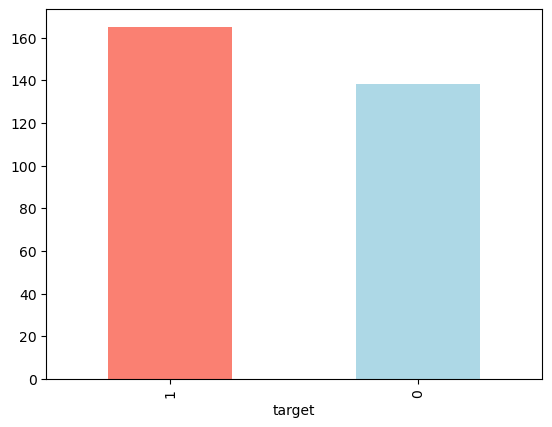

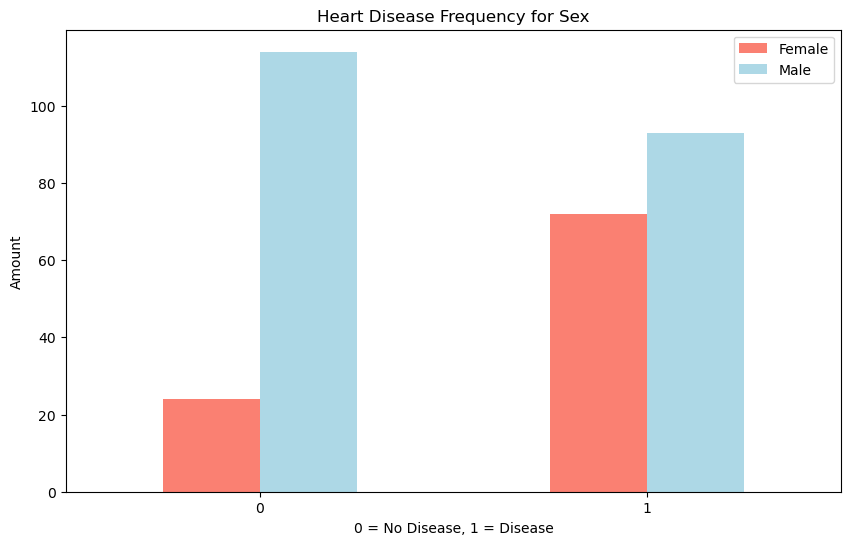

In [107]:
# Create a plot of crosstab
pd.crosstab(df.target, df.sex).plot(kind="bar",
                                    figsize=(10,6),
                                    color=["salmon","lightblue"])
plt.title("Heart Disease Frequency for Sex")
plt.xlabel("0 = No Disease, 1 = Disease")
plt.ylabel("Amount")
plt.legend(["Female", "Male"])
plt.xticks(rotation=0)
plt.show()

In [108]:
df["thalach"].value_counts()

thalach
162    11
160     9
163     9
152     8
173     8
       ..
202     1
184     1
121     1
192     1
90      1
Name: count, Length: 91, dtype: int64

### Age vs. Max Heart Rate fo Heart Disease

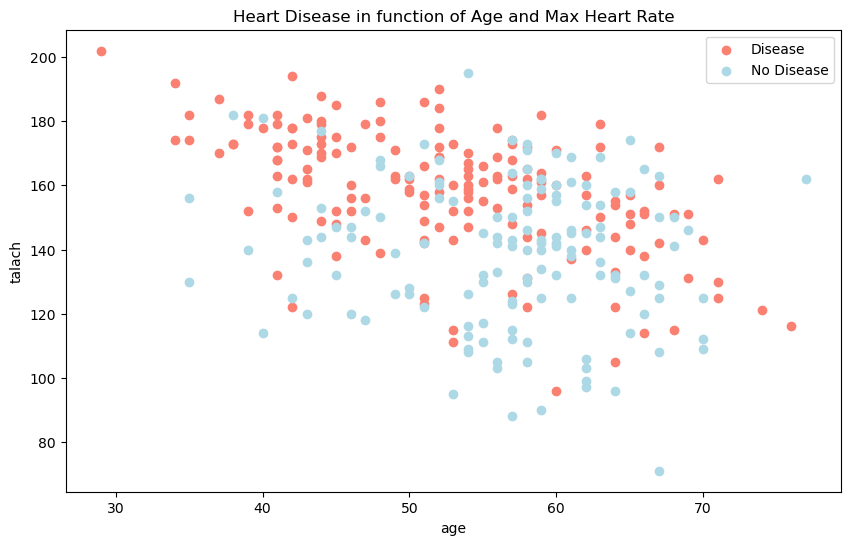

In [109]:
# Create antoher figure
plt.figure(figsize=(10,6))

# Scatter with positive examples
plt.scatter(df.age[df.target==1],
            df.thalach[df.target==1],
            c="salmon")# Scatter with positive examples

# Scatter with negative examples
plt.scatter(df.age[df.target==0],
            df.thalach[df.target==0],
            c="lightblue")

plt.xlabel("age")
plt.ylabel("talach")
plt.title("Heart Disease in function of Age and Max Heart Rate")
plt.legend(["Disease","No Disease"])
plt.show()

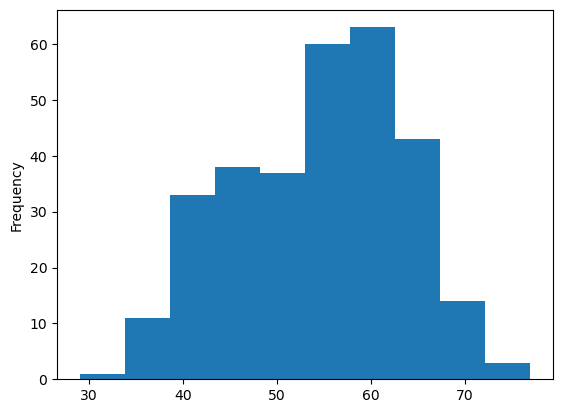

In [110]:
# Check the normal distribution of the age column with histogram
df.age.plot.hist();
plt.show()

### Heart disease Frequency Chest Pain Type

3. cp - chest pain type
    * 0: Typical angina: chest pain related decrease blood supply to the heart
    * 1: Atypical angina: chest pain not related to heart
    * 2: Non-anginal pain: typically esophageal spasms (non heart related)
    * 3: Asymptomatic: chest pain not showing signs of disease

In [111]:
pd.crosstab(df.cp, df.target)

target,0,1
cp,,
0,104,39
1,9,41
2,18,69
3,7,16


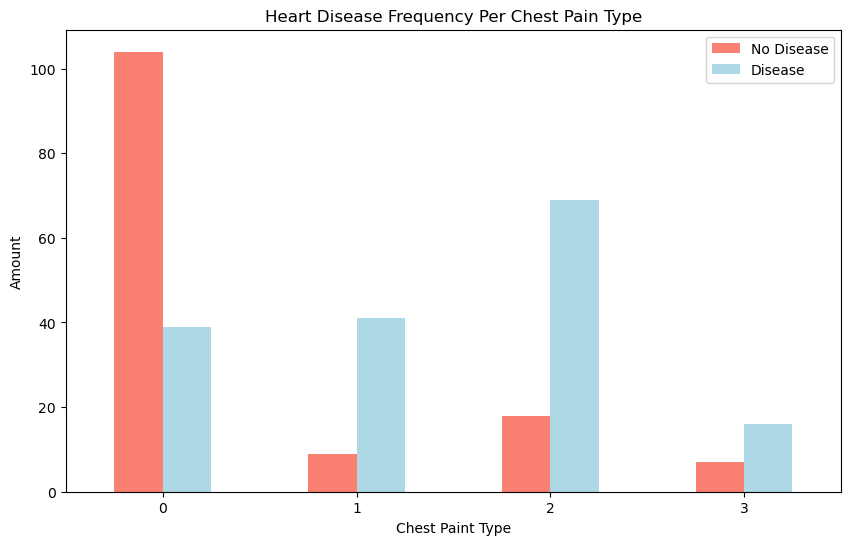

In [112]:
# Make the crosstab more visual
pd.crosstab(df.cp, df.target).plot(kind="bar",
                                   figsize=(10,6),
                                   color=["salmon","lightblue"])

# Add some comunication
plt.title("Heart Disease Frequency Per Chest Pain Type")
plt.xlabel("Chest Paint Type")
plt.ylabel("Amount")
plt.legend(["No Disease", "Disease"])
plt.xticks(rotation=0);
plt.show()

In [113]:
# Make a correlation matrix
df.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
age,1.000000,-0.098447,-0.068653,0.279351,0.213678,0.121308,-0.116211,-0.398522,0.096801,0.210013,-0.168814,0.276326,0.068001,-0.225439
sex,-0.098447,1.000000,-0.049353,-0.056769,-0.197912,0.045032,-0.058196,-0.044020,0.141664,0.096093,-0.030711,0.118261,0.210041,-0.280937
cp,-0.068653,-0.049353,1.000000,0.047608,-0.076904,0.094444,0.044421,0.295762,-0.394280,-0.149230,0.119717,-0.181053,-0.161736,0.433798
trestbps,0.279351,-0.056769,0.047608,1.000000,0.123174,0.177531,-0.114103,-0.046698,0.067616,0.193216,-0.121475,0.101389,0.062210,-0.144931
chol,0.213678,-0.197912,-0.076904,0.123174,1.000000,0.013294,-0.151040,-0.009940,0.067023,0.053952,-0.004038,0.070511,0.098803,-0.085239
fbs,0.121308,0.045032,0.094444,0.177531,0.013294,1.000000,-0.084189,-0.008567,0.025665,0.005747,-0.059894,0.137979,-0.032019,-0.028046
restecg,-0.116211,-0.058196,0.044421,-0.114103,-0.151040,-0.084189,1.000000,0.044123,-0.070733,-0.058770,0.093045,-0.072042,-0.011981,0.137230
thalach,-0.398522,-0.044020,0.295762,-0.046698,-0.009940,-0.008567,0.044123,1.000000,-0.378812,-0.344187,0.386784,-0.213177,-0.096439,0.421741
exang,0.096801,0.141664,-0.394280,0.067616,0.067023,0.025665,-0.070733,-0.378812,1.000000,0.288223,-0.257748,0.115739,0.206754,-0.436757
oldpeak,0.210013,0.096093,-0.149230,0.193216,0.053952,0.005747,-0.058770,-0.344187,0.288223,1.000000,-0.577537,0.222682,0.210244,-0.430696


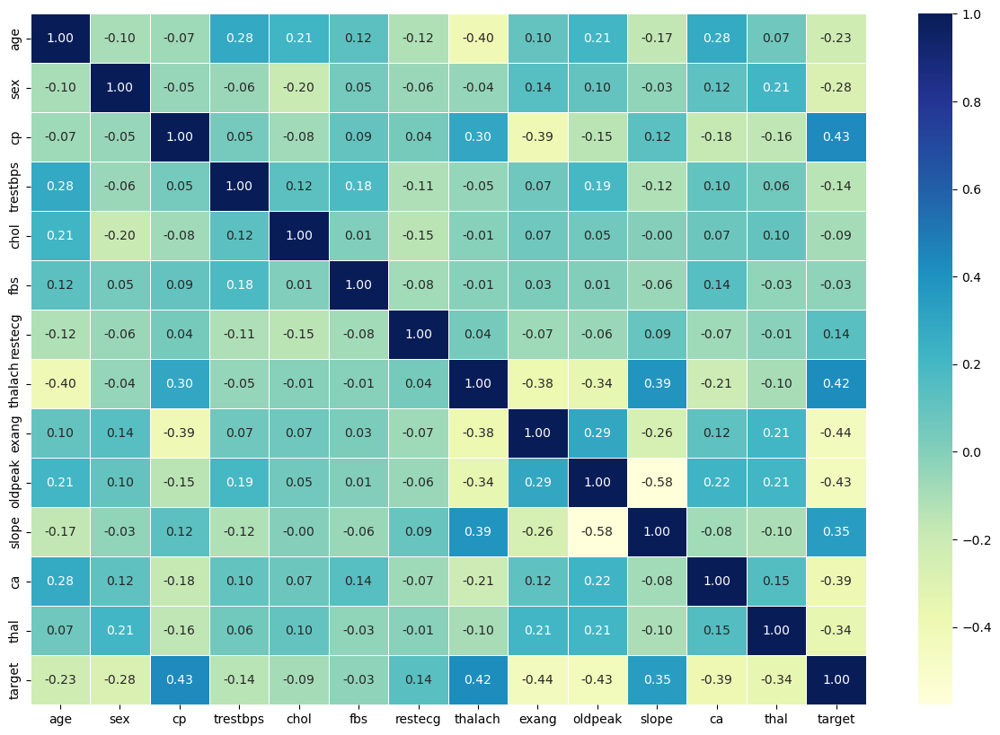

In [114]:
# Let's make our correlation matrix more visual
corr_matrix = df.corr()
fig, ax = plt.subplots(figsize=(15,10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
plt.show()

## 5. Modelling

In [115]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [116]:
# Split data into X and y
X = df.drop("target", axis=1)

y = df["target"]


In [117]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


Now we've got our data split and test sets, it's time to:
* build a machine learning model 
* train it on the train set 
* test it on the test set.

We're going to try 3 different machine learning models:
1. Logistic Regression
2. K-Nearest Neighbours Classifier
3. Random Forest Classifier


In [118]:
# Put models in a dictionary 
models = {"Logistic Regression": LogisticRegression(),
          "KNN":KNeighborsClassifier(),
          "Random  Forest": RandomForestClassifier()}
def fit_and_score(models, X_train, X_test, y_train, y_test):
    """
    Fits and evaluates given machine learning models.
    """
    # Set random seed
    np.random.seed(42)

    # Make a dictionary to keep model scores
    model_scores={}

    # Loop through models
    for name, model in models.items():
        # Fit the model to the data
        model.fit(X_train, y_train)
        # Evaluate the model and append its score to model_scores
        model_scores[name] = model.score(X_test, y_test)
        print(f"{name} model score: {model_scores[name]*100:.2f}%")
    return model_scores

In [119]:
results = fit_and_score(models, X_train, X_test, y_train, y_test)

c:\Users\jonas\Develop_area\udemy_course\sample_project\env\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression model score: 83.61%
KNN model score: 67.21%
Random  Forest model score: 86.89%


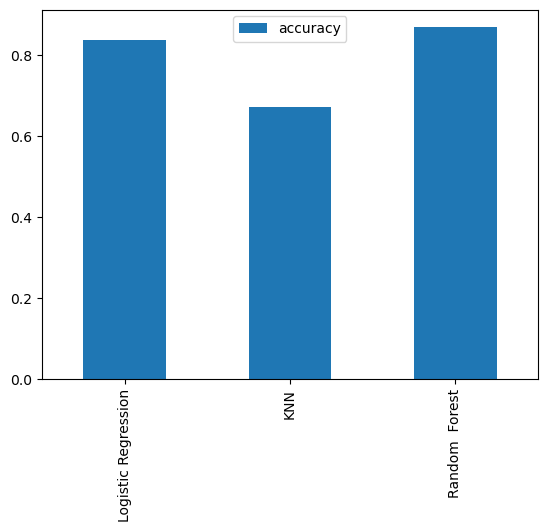

In [120]:
model_compare = pd.DataFrame(results, index=["accuracy"])
model_compare.T.plot.bar();
plt.show()

Now we've got a baseline model... and we know a model's first predictions aren't always what we should based our next steps off.
What should we do?

Let's look at the following:
* Hyperparameter tuning
* Feature importance
* Confusion matrix
* Cross-validation
* Precision 
* Recall
* F1 score
* Classification report
* ROC curve
* Area under the curve (AUC)

### Hyper parameter tuning

In [121]:
# Let's tune KNN

train_scores = []
test_scores = []

# Create a list of differnt values for n_neighbors
neighbors = range(1, 21)

# Setup KNN instance
knn = KNeighborsClassifier()

# Loop through different n_neighbors
for i in neighbors:
    knn.set_params(n_neighbors=i)
    
    # Fit the algorithm
    knn.fit(X_train, y_train)
    
    # Update the training scores list
    train_scores.append(knn.score(X_train, y_train))
    
    # Update the test scores list
    test_scores.append(knn.score(X_test, y_test))

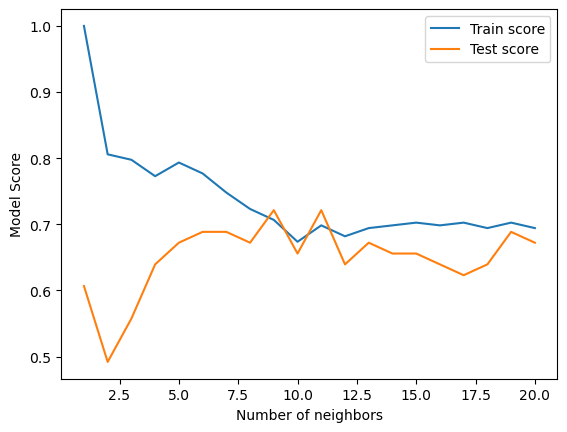

Maximu KNN score on the test data: 72.13


In [122]:
plt.plot(neighbors, train_scores, label="Train score")
plt.plot(neighbors, test_scores, label="Test score")
plt.xlabel("Number of neighbors")
plt.ylabel("Model Score")
plt.legend()
plt.show()
print(f"Maximu KNN score on the test data: {max(test_scores)*100:.2f}")

### Hyperparameter tuning with RandomizeSearchCV

We're going to tune:
* LogisticRegression()
* RandomForestClassifier()

... using RandomizedSearchCV

In [123]:
# Create a hyperparamter grid for LogisticRegression
log_reg_grid = {"C": np.logspace(-4,4,20),
                "solver":["liblinear"]}

# Create a hyperparameter grid for RandomForestClassifier
rf_grid = {"n_estimators":np.arange(10,1000,50),
           "max_depth":[None, 3,5,10],
           "min_samples_split":np.arange(2,20,2),
           "min_samples_leaf":np.arange(1,20,2)
           }

Now we've got hyperparameter grids setup for each of our models, let's tune them using RandomizedSearchCV...

In [124]:
# Tune Logistic Regression

np.random.seed(42)

# Setup random hyperparameter search for LogisticRegression
rs_log_reg = RandomizedSearchCV(LogisticRegression(),
                                param_distributions=log_reg_grid,
                                cv=5,
                                n_iter=20,
                                verbose=True)

# Fit random hyperparameter search model for LogisticRegression
rs_log_reg.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_iter=20,
                   param_distributions={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                                        'solver': ['liblinear']},
                   verbose=True)

In [125]:
rs_log_reg.best_params_

{'solver': 'liblinear', 'C': 0.08858667904100823}

In [126]:
rs_log_reg.score(X_test, y_test)

0.8688524590163934

Now we've tune LogiticRegression, let's do the same for RandomForestClassifier()...

In [127]:
# Setup random seed
np.random.seed(42)

# Setup random hyperparameter search for RandomForestClassifier
rs_rf = RandomizedSearchCV(RandomForestClassifier(),
                           param_distributions=rf_grid,
                           cv=5,
                           n_iter=20,
                           verbose=True)
# Fit random hyperparameter search model for RandomForestClassifier()
rs_rf.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=20,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([ 10,  60, 110, 160, 210, 260, 310, 360, 410, 460, 510, 560, 610,
       660, 710, 760, 810, 860, 910, 960])},
                   verbose=True)

In [128]:
# Find best params
rs_rf.best_params_

{'n_estimators': 260,
 'min_samples_split': 8,
 'min_samples_leaf': 19,
 'max_depth': None}

In [129]:
# Evaluate the randomzied search RandomForestClassifier model
rs_rf.score(X_test, y_test)

0.8852459016393442

### Hyperparameter Tuning with GridSearchCV

Since our LogisticRegression model provides the best scores so far, we'll try and improve them again usin GridSearchCV

In [130]:
# Different hyperparameters for our LogisticRegression model
log_reg_grid = {"C": np.logspace(-4,4,30),
                "solver":["liblinear"]}
np.random.seed(42)
# Setup grid hyperparameter search for LogisticRegression
gs_log_reg = GridSearchCV(LogisticRegression(),
                          param_grid=log_reg_grid,
                          cv=5,
                          verbose=True)

# Fit the model
gs_log_reg.fit(X_train, y_train)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.00000000e-04, 1.88739182e-04, 3.56224789e-04, 6.72335754e-04,
       1.26896100e-03, 2.39502662e-03, 4.52035366e-03, 8.53167852e-03,
       1.61026203e-02, 3.03919538e-02, 5.73615251e-02, 1.08263673e-01,
       2.04335972e-01, 3.85662042e-01, 7.27895384e-01, 1.37382380e+00,
       2.59294380e+00, 4.89390092e+00, 9.23670857e+00, 1.74332882e+01,
       3.29034456e+01, 6.21016942e+01, 1.17210230e+02, 2.21221629e+02,
       4.17531894e+02, 7.88046282e+02, 1.48735211e+03, 2.80721620e+03,
       5.29831691e+03, 1.00000000e+04]),
                         'solver': ['liblinear']},
             verbose=True)

In [131]:
# Find the best params
gs_log_reg.best_params_

{'C': 0.1082636733874054, 'solver': 'liblinear'}

In [132]:
gs_log_reg.score(X_test, y_test)

0.8688524590163934

### Evaluating our tuned machine learning classifier beyond accuracy:

* ROC curve and AUC score
* Confusion matrix
* Classification report
* Precision
* Recall
* F1-score

... and it would be great if cross-validation was used where possible.

To make comparison and evaluate our trained model, fist we need to make predictions.

In [137]:
# Make predictions with tuned model
y_preds_prob =  gs_log_reg.predict_proba(X_test)
y_preds_prob

array([[0.3452106 , 0.6547894 ],
       [0.20971521, 0.79028479],
       [0.36570704, 0.63429296],
       [0.3869789 , 0.6130211 ],
       [0.77495172, 0.22504828],
       [0.20105897, 0.79894103],
       [0.25378121, 0.74621879],
       [0.93929476, 0.06070524],
       [0.90401783, 0.09598217],
       [0.79377084, 0.20622916],
       [0.05214353, 0.94785647],
       [0.07593203, 0.92406797],
       [0.33120663, 0.66879337],
       [0.1141966 , 0.8858034 ],
       [0.36958356, 0.63041644],
       [0.71482901, 0.28517099],
       [0.10789108, 0.89210892],
       [0.6137652 , 0.3862348 ],
       [0.15418991, 0.84581009],
       [0.97651253, 0.02348747],
       [0.31470464, 0.68529536],
       [0.21310895, 0.78689105],
       [0.9099686 , 0.0900314 ],
       [0.97352414, 0.02647586],
       [0.31855654, 0.68144346],
       [0.07922954, 0.92077046],
       [0.45171905, 0.54828095],
       [0.58973858, 0.41026142],
       [0.41097832, 0.58902168],
       [0.11602288, 0.88397712],
       [0.

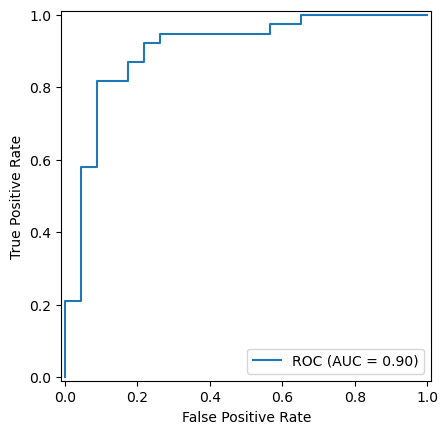

In [151]:
# Plot ROC curve and calculate AUC metric
from sklearn.metrics import roc_curve, auc
# we take the positive rate
fpr, tpr, thresholds = roc_curve(y_test,  y_preds_prob[:,1])
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr,
                         tpr=tpr, 
                          estimator_name="ROC", 
                          roc_auc=roc_auc)
display.plot()
plt.show()


In [152]:
# Confusion matrix
y_preds = gs_log_reg.predict(X_test)
print(confusion_matrix(y_test, y_preds))

[[17  6]
 [ 2 36]]


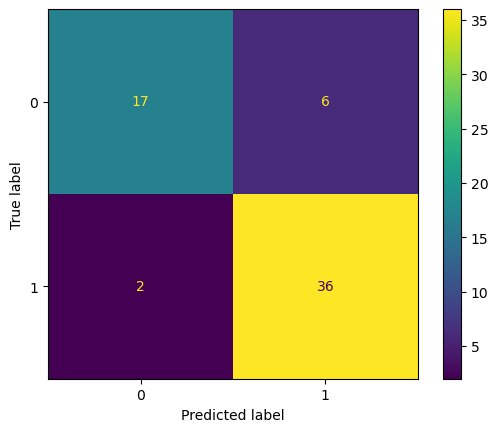

In [153]:
from sklearn.metrics import ConfusionMatrixDisplay
confusion_matrix_display = ConfusionMatrixDisplay(confusion_matrix(y_test, y_preds))
confusion_matrix_display.plot()
plt.show()


Now we've got a ROC curve, an AUC metric and a confusion matrix, let's get a classification report 
as well as cross-validated precision, recall and f1-score

In [155]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.89      0.74      0.81        23
           1       0.86      0.95      0.90        38

    accuracy                           0.87        61
   macro avg       0.88      0.84      0.85        61
weighted avg       0.87      0.87      0.87        61



### Calculate evaluation metrics using cross-validation

We're going to calculate accuracy, precision, recall and f1-score of our model using cross-validation and to do so we'll be using `cross_val_score()`.

In [156]:
# Check best hyperparameters
gs_log_reg.best_params_

{'C': 0.1082636733874054, 'solver': 'liblinear'}

In [158]:
# Create a new classifier with best parameters
clf = LogisticRegression(C=0.1082636733874054,
                         solver='liblinear')

In [160]:
# Cross-validated accuracy
cv_acc = cross_val_score(clf,
                         X,
                         y,
                         cv=5,
                         scoring="accuracy")
cv_acc = cv_acc.mean()
cv_acc

0.834808743169399

In [161]:
# Cross-validated precision
cv_prec = cross_val_score(clf,
                         X,
                         y,
                         cv=5,
                         scoring="precision")
cv_prec = cv_prec.mean()
cv_prec

0.8182683982683983

In [162]:
# Cross-validated recall
cv_recall = cross_val_score(clf,
                         X,
                         y,
                         cv=5,
                         scoring="recall")
cv_recall = cv_recall.mean()
cv_recall

0.9030303030303031

In [163]:
# Cross-validated f1-score
cv_f1 = cross_val_score(clf,
                         X,
                         y,
                         cv=5,
                         scoring="f1")
cv_f1 = cv_f1.mean()
cv_f1

0.8572876223964055

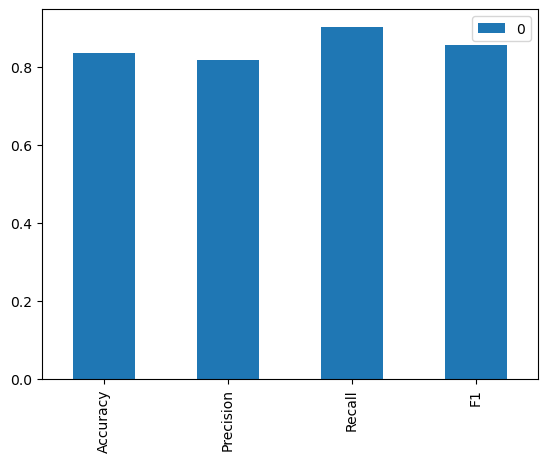

In [166]:
# Visualize cross-validated metrics
cv_metrics = pd.DataFrame({"Accuracy":cv_acc,
                           "Precision":cv_prec,
                           "Recall":cv_recall,
                           "F1":cv_f1},
                           index=[0])
cv_metrics.T.plot.bar()
plt.show()

### Feature Importance

Feature importance is another way as asking, "which features contributed most to the outcomes of the model and how did they contribute?"

Finding feature importance is different for each machine learning model.

Let's find the feature importance for our LogisticRegression model...

In [168]:
# Fit an instance of LogisticRegression
clf = LogisticRegression(C=0.1082636733874054,
                         solver='liblinear')

clf.fit(X_train, y_train)


LogisticRegression(C=0.1082636733874054, solver='liblinear')

In [169]:
# Check coefficient
clf.coef_

array([[ 0.00882855, -0.64703659,  0.60119932, -0.0172631 , -0.00104588,
         0.08617683,  0.3813078 ,  0.02555093, -0.35997138, -0.47462675,
         0.31244075, -0.49113432, -0.64515705]])

In [170]:
# Match coef's of features to columns

feature_dict = dict(zip(df.columns, list(clf.coef_[0])))
feature_dict

{'age': 0.008828546130267349,
 'sex': -0.6470365877795955,
 'cp': 0.6011993212665192,
 'trestbps': -0.01726309535593756,
 'chol': -0.0010458838830176315,
 'fbs': 0.08617682626397086,
 'restecg': 0.38130780052568225,
 'thalach': 0.025550926921129556,
 'exang': -0.35997137841043986,
 'oldpeak': -0.47462675000382887,
 'slope': 0.3124407487404517,
 'ca': -0.49113432068343094,
 'thal': -0.6451570528046852}

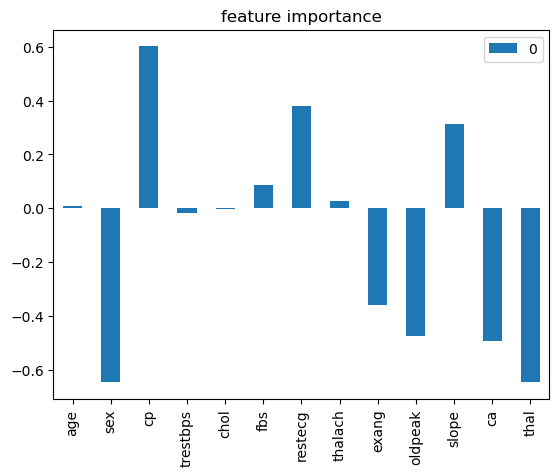

In [171]:
# Visualize feature importance
feature_df = pd.DataFrame(feature_dict, index=[0])
feature_df.T.plot.bar(title="feature importance")
plt.show()

le colonne che sono quasi nulle indicano che quel parametro influisce minimamente nel target

In [172]:

# negativa nel grafico, se il sesso "aumenta" diminuisce il numero di persone affette
pd.crosstab(df["sex"],df["target"])

target,0,1
sex,,
0,24,72
1,114,93


In [173]:
# positiva nel grafico, se aumenta lo slope aumenta anche la percentuale target
pd.crosstab(df["slope"], df["target"])

target,0,1
slope,,
0,12,9
1,91,49
2,35,107


## 6. Experimentation

If you haven't hit youre evaluation metric yet... ask yourself...

* Could you collect more data?
* Could you try a better model? Like CatBoost or XGBoost
* Could you improve the current models? (beyond what we've done so far)

### Tryng CatBoost or XGBoost

In [176]:
# import the models
from catboost import CatBoostClassifier

model = CatBoostClassifier()
results = cross_val_score(model,
                          X,
                          y, 
                          cv=5,
                          verbose=True)
results

Learning rate set to 0.005621
0:	learn: 0.6886545	total: 142ms	remaining: 2m 21s
1:	learn: 0.6845802	total: 145ms	remaining: 1m 12s
2:	learn: 0.6806476	total: 148ms	remaining: 49s
3:	learn: 0.6758289	total: 150ms	remaining: 37.4s
4:	learn: 0.6725414	total: 153ms	remaining: 30.4s
5:	learn: 0.6686069	total: 155ms	remaining: 25.7s
6:	learn: 0.6650311	total: 158ms	remaining: 22.4s
7:	learn: 0.6604298	total: 161ms	remaining: 19.9s
8:	learn: 0.6566133	total: 163ms	remaining: 18s
9:	learn: 0.6529931	total: 166ms	remaining: 16.4s
10:	learn: 0.6495522	total: 168ms	remaining: 15.1s
11:	learn: 0.6449629	total: 170ms	remaining: 14s
12:	learn: 0.6411355	total: 175ms	remaining: 13.3s
13:	learn: 0.6366165	total: 178ms	remaining: 12.5s
14:	learn: 0.6323877	total: 181ms	remaining: 11.9s
15:	learn: 0.6283174	total: 183ms	remaining: 11.3s
16:	learn: 0.6242523	total: 186ms	remaining: 10.7s
17:	learn: 0.6212352	total: 191ms	remaining: 10.4s
18:	learn: 0.6176773	total: 195ms	remaining: 10s
19:	learn: 0.6142

array([0.86885246, 0.86885246, 0.81967213, 0.81666667, 0.78333333])

In [182]:
# tuning the model with GridSearch
grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

grid_search_result = GridSearchCV(CatBoostClassifier(),
                                  param_grid=grid, 
                                  cv=5,
                                  verbose=True
                                  )
grid_search_result.fit(X_train, y_train)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
0:	learn: 0.6740070	total: 2.46ms	remaining: 2.46s
1:	learn: 0.6556690	total: 5.03ms	remaining: 2.51s
2:	learn: 0.6425051	total: 6.67ms	remaining: 2.21s
3:	learn: 0.6233849	total: 8.4ms	remaining: 2.09s
4:	learn: 0.6070312	total: 10.5ms	remaining: 2.08s
5:	learn: 0.5950860	total: 12.3ms	remaining: 2.04s
6:	learn: 0.5817807	total: 14.3ms	remaining: 2.02s
7:	learn: 0.5695708	total: 16.2ms	remaining: 2.01s
8:	learn: 0.5605445	total: 18.5ms	remaining: 2.04s
9:	learn: 0.5504459	total: 20.6ms	remaining: 2.04s
10:	learn: 0.5415079	total: 22.7ms	remaining: 2.04s
11:	learn: 0.5282574	total: 24.8ms	remaining: 2.04s
12:	learn: 0.5176227	total: 26.8ms	remaining: 2.04s
13:	learn: 0.5056679	total: 28.6ms	remaining: 2.02s
14:	learn: 0.4949317	total: 30.6ms	remaining: 2.01s
15:	learn: 0.4855474	total: 32.5ms	remaining: 2s
16:	learn: 0.4782328	total: 34.5ms	remaining: 1.99s
17:	learn: 0.4688955	total: 36.3ms	remaining: 1.98s
18:	learn: 0.463

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x000002812F3E30B0>,
             param_grid={'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9],
                         'learning_rate': [0.03, 0.1]},
             verbose=True)

In [183]:
grid_search_result.best_params_

{'depth': 6, 'l2_leaf_reg': 3, 'learning_rate': 0.03}

In [184]:
grid_search_result.score(X_test, y_test)

0.8360655737704918